# The Battle of Neighborhoods


### Import all the necessary Libraries

In [1]:
# import required packages
import pandas as pd 
from bs4 import BeautifulSoup
import requests # library to handle requests
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values
from IPython.display import Image 
from IPython.core.display import HTML 
from IPython.display import display_html
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize
import folium # plotting library
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors
print ('done!')

done!


## 1. Generate a dataset with postal codes and coordinates for all the neighbourhood in Toronto

### 1.1 Extract the Postal code detail of canada from the wikipedia link
#### Using BeautifulSoup

In [2]:
source = requests.get('https://en.wikipedia.org/w/index.php?title=List_of_postal_codes_of_Canada:_M&oldid=954731857').text
soup_source=BeautifulSoup(source,'lxml')
raw_data = str(soup_source.table)

### Create a dataframe out of the extracted data

In [3]:
table_content = pd.read_html(raw_data)
df_full=table_content[0]
df_full.head(13)

,Postal code,Borough,Neighborhood
0,M1A,Not assigned,NaN
1,M2A,Not assigned,NaN
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,Regent Park / Harbourfront
5,M6A,North York,Lawrence Manor / Lawrence Heights
6,M7A,Downtown Toronto,Queen's Park / Ontario Provincial Government
7,M8A,Not assigned,NaN
8,M9A,Etobicoke,Islington Avenue
9,M1B,Scarborough,Malvern / Rouge


### Drop the rows where Borough is 'Not Assigned'

In [4]:
df_1 = df_full[df_full.Borough != 'Not assigned']
df_1.head()

,Postal code,Borough,Neighborhood
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,Regent Park / Harbourfront
5,M6A,North York,Lawrence Manor / Lawrence Heights
6,M7A,Downtown Toronto,Queen's Park / Ontario Provincial Government


### Combining the neighbourhoods with same Postalcode

In [6]:
df = df_1.groupby(['Postal code','Borough'], sort=False).agg(', '.join)
df.reset_index(inplace=True)

### Replacing the name of the neighbourhoods which are 'Not assigned' with names of Borough

In [7]:

df['Neighborhood'] = np.where(df['Neighborhood'] == 'NaN',df['Borough'], df['Neighborhood'])

df['Borough']=df['Borough'].replace({'Downtown TorontoStn A PO Boxes25 The Esplanade':'Downtown Toronto Stn A',
                                             'East TorontoBusiness reply mail Processing Centre969 Eastern':'East Toronto Business',
                                             'EtobicokeNorthwest':'Etobicoke Northwest','East YorkEast Toronto':'East York/East Toronto',
                                             'MississaugaCanada Post Gateway Processing Centre':'Mississauga'})

df['Neighborhood'] = df['Neighborhood'].str.replace("/", ",")
df.head()

,Postal code,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park , Harbourfront"
3,M6A,North York,"Lawrence Manor , Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park , Ontario Provincial Government"


### Print the number of rows of the dataframe

In [8]:
df.shape

(103, 3)

### Save the postal code data into a csv

In [9]:
#Save data as'toronto_PostalCode.csv'
df.to_csv('toronto_PostalCode.csv')
print('Successfully Saved!')

Successfully Saved!


### 1.2 Downloading csv file that has the geographical coordinates of each postal code

In [10]:
#Get the geographical coordinate from the Geospatial dataset csv (provided as a part of the assignment)
geo_location = pd.read_csv("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs_v1/Geospatial_Coordinates.csv")
geo_location.head()

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


### 1.3 Match the Postal codes to the geo coordinate data and create a dataframe

In [11]:
#rename the postal code column name similar to the original df
geo_location.rename(columns={'Postal Code':'Postal code'},inplace=True)

#Merge the latitude and logitudes to the original df
df_ll = pd.merge(df,geo_location,)
df_ll.head()

,Postal code,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park , Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor , Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park , Ontario Provincial Government",43.662301,-79.389494


### 1.4 Select only the records corresponding to Toronto

In [12]:
#Select rows that contains 'Toronto' in the Borough
df_Toronto = df_ll[df_ll['Borough'].str.contains('Central Toronto',regex=False)].reset_index(drop=True)
df_Toronto



,Postal code,Borough,Neighborhood,Latitude,Longitude
0,M4N,Central Toronto,Lawrence Park,43.728020,-79.388790
1,M5N,Central Toronto,Roselawn,43.711695,-79.416936
2,M4P,Central Toronto,Davisville North,43.712751,-79.390197
3,M5P,Central Toronto,Forest Hill North & West,43.696948,-79.411307
4,M4R,Central Toronto,North Toronto West,43.715383,-79.405678
5,M5R,Central Toronto,"The Annex , North Midtown , Yorkville",43.672710,-79.405678
6,M4S,Central Toronto,Davisville,43.704324,-79.388790
7,M4T,Central Toronto,"Moore Park , Summerhill East",43.689574,-79.383160
8,M4V,Central Toronto,"Summerhill West , Rathnelly , South Hill , For...",43.686412,-79.400049


### 1.5 Get the coordinates for Toronto

In [13]:
address = 'Central Toronto'

geolocator = Nominatim(user_agent="Toronto_explorer")
location = geolocator.geocode(address)
tor_latitude = location.latitude
tor_longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(tor_latitude, tor_longitude))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


## 2. Gather the venue details (Laundromats/Hotels) for the Toronto Neighborhood

In [15]:
# Search for laundromats in the neighborhood of Central Toronto

# import k-means from clustering stage
from sklearn.cluster import KMeans

import numpy as np
!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Libraries imported.


### 2.1 Setup the Foursquare credentials

#### (For security purpose, the credentials were blanked out before submission)

In [37]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20181111' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 
CLIENT_SECRET:


### 2.2 Function to fetch the Laundromat information for the given coordinates

In [17]:
def getNearbyLaundryVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&query={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            'Laundromat Laundry',
            radius, 
            100)
            
        # make the GET request
        results = requests.get(url).json()["response"]['venues']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['name'], 
            v['location']['lat'], 
            v['location']['lng'],  
            v['categories'][0]['name']) for v in results if v['categories']])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

### 2.2.1 Fetch the Laudromat informations for all the coordinates in Toronto neighborhood

In [36]:
laundro_venues = getNearbyLaundryVenues(df_Toronto['Neighborhood'],df_Toronto["Latitude"],df_Toronto['Longitude'],2000)
laundro_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Lawrence Park,43.728020,-79.388790,Maytag Laundry Linens And Gifts,43.730241,-79.403576,Laundry Service
1,Roselawn,43.711695,-79.416936,Royal Forest Coin Laundry,43.701115,-79.425177,Laundry Service
2,Roselawn,43.711695,-79.416936,Bathurst Street Coin Laundry,43.723356,-79.430118,Laundry Service
3,Roselawn,43.711695,-79.416936,Empire Dry Cleaners & Laundry Services - Etob...,43.699698,-79.415735,Dry Cleaner
4,Roselawn,43.711695,-79.416936,Coin Laundry,43.724148,-79.430481,Laundry Service


### 2.3 Function to fetch the hotel information for the given coordinates

In [19]:
# Define getNearbyHotelVenues function for extracting Hotel venues

def getNearbyHotelVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&query={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            'Hostel Hotel',
            radius, 
            100)
            
        # make the GET request
        results = requests.get(url).json()["response"]['venues']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['name'], 
            v['location']['lat'], 
            v['location']['lng'],  
            v['categories'][0]['name']) for v in results if v['categories']])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

### 2.3.1 Fetch the Hotel informations for all the coordinates in Toronto neighborhood

In [20]:
hotel_venues = getNearbyHotelVenues(df_Toronto['Neighborhood'],df_Toronto["Latitude"],df_Toronto['Longitude'],2000)
hotel_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Lawrence Park,43.728020,-79.388790,Hotel Wibke,43.707730,-79.395858,Speakeasy
1,Lawrence Park,43.728020,-79.388790,Best Western Roehampton Hotel & Suites,43.708878,-79.390880,Hotel
2,Lawrence Park,43.728020,-79.388790,Skyline Hotels & Resorts,43.707578,-79.395640,Office
3,Roselawn,43.711695,-79.416936,Hotel Gelato,43.703478,-79.414311,Café
4,Roselawn,43.711695,-79.416936,Hotel Wibke,43.707730,-79.395858,Speakeasy


### 3. Perform Clustering on the Laudromat and Hotel data

### 3.1 Generate Folium map to show the venue location for laundromats and Hotels

In [34]:

# create map
map_clusters = folium.Map(location=[tor_latitude, tor_longitude], zoom_start=12)

# add markers to the map
markers_colors = []
for lat, lon, poi in zip(laundro_venues['Venue Latitude'], laundro_venues['Venue Longitude'], laundro_venues['Venue']):
    label = folium.Popup(str(poi), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7).add_to(map_clusters)
    
for lat, lon, poi in zip(hotel_venues['Venue Latitude'], hotel_venues['Venue Longitude'], hotel_venues['Venue']):
    label = folium.Popup(str(poi), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

##### Screenshot of resulting map
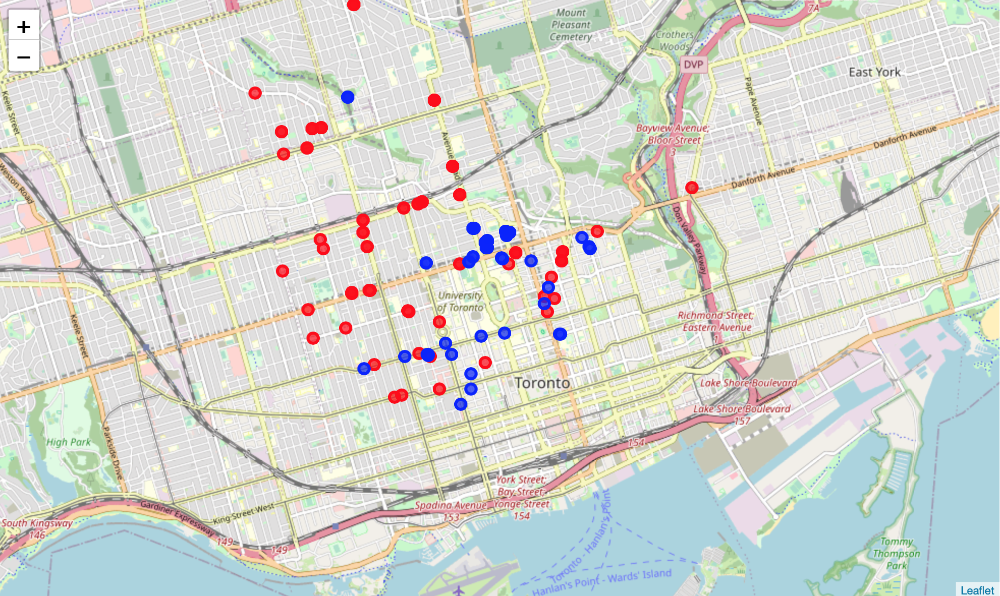

### 3.2 Tabulate coordinates of laundromats and hotels

In [23]:

laundro_feature = laundro_venues[['Venue Latitude','Venue Longitude']]
hotel_feature = hotel_venues[['Venue Latitude','Venue Longitude']]

### 3.3 Perform heirarchial clustering to group near by Laudries and hotels

In [24]:
from sklearn.preprocessing import MinMaxScaler
laundro_data = laundro_feature.values #returns a numpy array
hotel_data = hotel_feature.values
min_max_scaler = MinMaxScaler()
laundro_mtx = min_max_scaler.fit_transform(laundro_data)
hotel_mtx = min_max_scaler.fit_transform(hotel_data)
laundro_mtx [0:5]

array([[1.        , 0.3904177 ],
       [0.6288908 , 0.09697779],
       [0.91227002, 0.02986149],
       [0.61082873, 0.22524311],
       [0.9223651 , 0.02492547]])

In [25]:
import scipy
laundro_leng = laundro_mtx.shape[0]
laundro_D = scipy.zeros([laundro_leng,laundro_leng])
for i in range(laundro_leng):
    for j in range(laundro_leng):
        laundro_D[i,j] = scipy.spatial.distance.euclidean(laundro_mtx[i], laundro_mtx[j])
        
print(laundro_D)

[[0.         0.47310571 0.3710759  ... 0.75830948 0.8358833  0.37579332]
 [0.47310571 0.         0.29121879 ... 0.40192747 0.7289435  0.49889405]
 [0.3710759  0.29121879 0.         ... 0.69132031 0.96253584 0.60775833]
 ...
 [0.75830948 0.40192747 0.69132031 ... 0.         0.45895701 0.55083028]
 [0.8358833  0.7289435  0.96253584 ... 0.45895701 0.         0.47154443]
 [0.37579332 0.49889405 0.60775833 ... 0.55083028 0.47154443 0.        ]]


In [26]:
# Import libraries
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
import pylab
import scipy.cluster.hierarchy
from scipy.cluster.hierarchy import fcluster

# Perform clustering
laundro_Z = hierarchy.linkage(laundro_D, 'complete')
max_d = 3
laundro_clusters = fcluster(laundro_Z, max_d, criterion='distance')
laundro_dend = hierarchy.dendrogram(laundro_Z)

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  if __name__ == '__main__':


In [27]:
hotel_leng = hotel_mtx.shape[0]
hotel_D = scipy.zeros([hotel_leng,hotel_leng])
for i in range(hotel_leng):
    for j in range(hotel_leng):
        hotel_D[i,j] = scipy.spatial.distance.euclidean(hotel_mtx[i], hotel_mtx[j])
        
print(hotel_D)

[[0.         0.11496622 0.00561036 ... 0.6294779  0.68069046 0.70466877]
 [0.11496622 0.         0.11058236 ... 0.63602535 0.7114403  0.7590232 ]
 [0.00561036 0.11058236 0.         ... 0.62591027 0.67817642 0.70337434]
 ...
 [0.6294779  0.63602535 0.62591027 ... 0.         0.15519847 0.31027692]
 [0.68069046 0.7114403  0.67817642 ... 0.15519847 0.         0.16185569]
 [0.70466877 0.7590232  0.70337434 ... 0.31027692 0.16185569 0.        ]]


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  


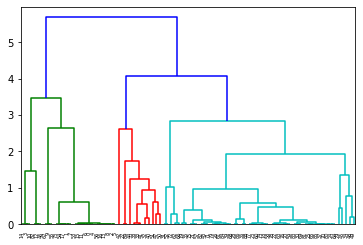

In [28]:
# Perform clustering
hotel_Z = hierarchy.linkage(hotel_D, 'complete')
max_d = 3
hotel_clusters = fcluster(hotel_Z, max_d, criterion='distance')
hotel_dend = hierarchy.dendrogram(hotel_Z)

### 4. Find Suitable location for setting up new laundromats

### 4.1 append cluster numbers to the venue data frames

In [29]:
laundro_venues['cluster_'] = laundro_clusters
hotel_venues['cluster_'] = hotel_clusters

### 4.2 Generate a Folium map to illustrate the clusters of laundromats and hotels 
#### (Reds: Laundromats, Blues: Hotels)




In [30]:
# create map
map_clusters = folium.Map(location=[tor_latitude, tor_longitude], zoom_start=12)

# set color scheme for the laundromat clusters
laundro_kclusters = laundro_clusters.max()
x = np.arange(laundro_kclusters)
ys = [i+x+(i*x)**2 for i in range(laundro_kclusters)]
colors_array = cm.rainbow(np.linspace(0.8, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(laundro_venues['Venue Latitude'], laundro_venues['Venue Longitude'], laundro_venues['Venue'], laundro_venues['cluster_']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
    
# set color scheme for the hotel clusters
hotel_kclusters = hotel_clusters.max()
x = np.arange(hotel_kclusters)
ys = [i+x+(i*x)**2 for i in range(hotel_kclusters)]
colors_array = cm.rainbow(np.linspace(0.1, 0.3, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(hotel_venues['Venue Latitude'], hotel_venues['Venue Longitude'], hotel_venues['Venue'], hotel_venues['cluster_']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

##### Screenshot of resulting map
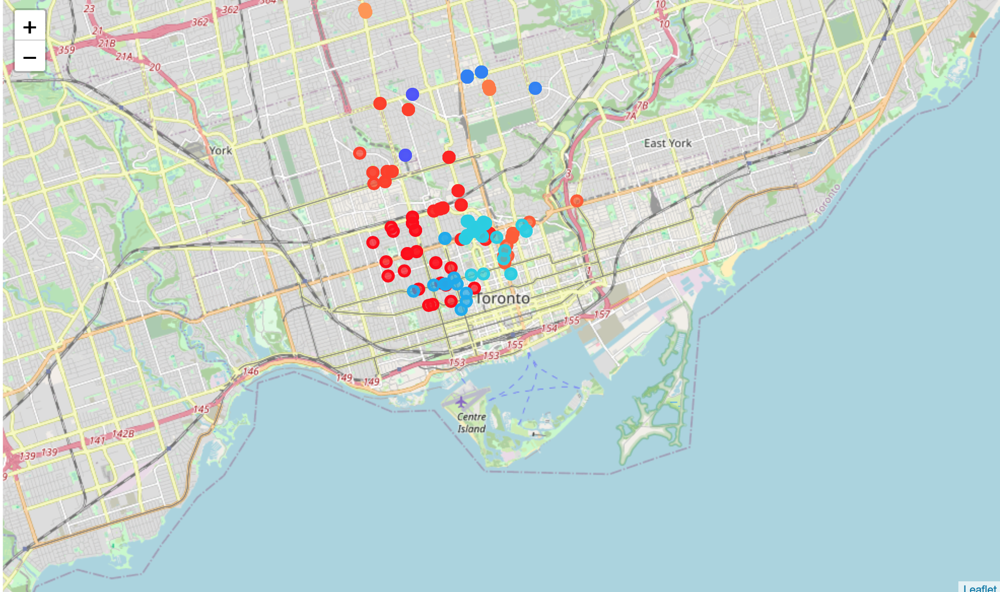

### 4.3 Extracting the coordinate of cluster centers for better visualisation of laundromat and hotel hotspots around Central Toronto




In [31]:
laundro_mean = pd.DataFrame(columns=['Venue Latitude','Venue Longitude'])
laundro_count = pd.DataFrame(columns=['Number of Venues'])
hotel_mean = pd.DataFrame(columns=['Venue Latitude','Venue Longitude'])
hotel_count = pd.DataFrame(columns=['Number of Venues'])

for i in range(1,laundro_kclusters+1):
    laundro_mean.loc[i-1,:]=laundro_venues[laundro_venues['cluster_']==i][['Venue Latitude','Venue Longitude']].mean()
    laundro_count.loc[i-1] = laundro_venues[laundro_venues['cluster_']==i]['cluster_'].count()

for i in range(1,hotel_kclusters+1):
    hotel_mean.loc[i-1,:]=hotel_venues[hotel_venues['cluster_']==i][['Venue Latitude','Venue Longitude']].mean()
    hotel_count.loc[i-1] = hotel_venues[hotel_venues['cluster_']==i]['cluster_'].count()
    
laundro_mean = pd.concat([laundro_mean, laundro_count], axis=1, sort=False)
hotel_mean = pd.concat([hotel_mean, hotel_count], axis=1, sort=False)
print('Laundromat clusters: \n',laundro_mean)
print('Hotel clusters: \n',hotel_mean)

Laundromat clusters: 
   Venue Latitude Venue Longitude Number of Venues
0        43.7271        -79.4236               11
1         43.705        -79.3884               12
2        43.6683         -79.379               12
3        43.6897        -79.4228               20
4        43.6769        -79.4002               29
5        43.6633        -79.4124               27
Hotel clusters: 
   Venue Latitude Venue Longitude Number of Venues
0        43.6959        -79.4155                6
1        43.7075        -79.3911               20
2        43.6577        -79.4022               12
3        43.6696        -79.3909               52




### 4.4 Generating Folium map with showing laundromat and hotel clusters, with larger circles representing a higher concentration of venues

#### (Reds: Laundromats, Blues: Hotels)



In [32]:
# create map
map_center_clusters = folium.Map(location=[tor_latitude, tor_longitude], zoom_start=12)

# set color scheme for the laundromat clusters
laundro_kclusters = laundro_clusters.max()
x = np.arange(laundro_kclusters)
ys = [i+x+(i*x)**2 for i in range(laundro_kclusters)]
colors_array = cm.rainbow(np.linspace(0.8, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
scale_laundry = laundro_mean['Number of Venues'].max()
for lat, lon, clustsize, clustnum in zip(laundro_mean['Venue Latitude'], laundro_mean['Venue Longitude'], laundro_mean['Number of Venues'],laundro_mean.index):
    label = folium.Popup(' Laundromat Cluster ' + str(clustnum+1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=clustsize/scale_laundry*30,
        popup=label,
        color=rainbow[clustnum],
        fill=True,
        fill_color=rainbow[clustnum],
        fill_opacity=0.7).add_to(map_center_clusters)
    
# set color scheme for the hotel clusters
hotel_kclusters = hotel_clusters.max()
x = np.arange(hotel_kclusters)
ys = [i+x+(i*x)**2 for i in range(hotel_kclusters)]
colors_array = cm.rainbow(np.linspace(0.1, 0.3, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
scale_hotel = hotel_mean['Number of Venues'].max()
for lat, lon, clustsize, clustnum in zip(hotel_mean['Venue Latitude'], hotel_mean['Venue Longitude'], hotel_mean['Number of Venues'], hotel_mean.index):
    label = folium.Popup(' Hotel Cluster ' + str(clustnum+1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=clustsize/scale_hotel*30,
        popup=label,
        color=rainbow[clustnum],
        fill=True,
        fill_color=rainbow[clustnum],
        fill_opacity=0.7).add_to(map_center_clusters)
       
map_center_clusters

##### Screenshot of resulting map

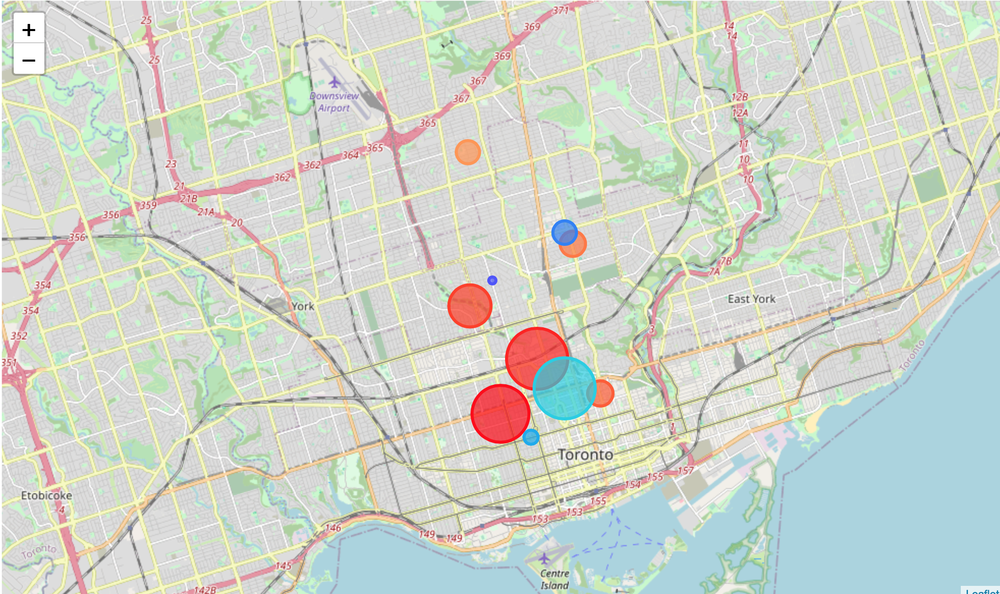